# Mixin: Music Annotation Exploratory Analysis

# Table of Contents
1. [Overview of Mixin Project](#Overview-of-Mixin-Project)
2. [Current Stage: Automated Chorus Identification](#Current-Stage:-Automated-Chorus-Identification)
3. [Exploratory Analysis](#Exploratory-Analysis)
    - [Data Profile](#Data-Profile)
    - [Label Validation](#Label-Validation)
    - [Audio Feature Generation & Visualization](#Audio-Feature-Generation-&-Visualization)
    - [Insights and Findings](#Insights-and-Findings)

---

# Overview of the Mixin Project
#### The Quest for an AI DJ

The year is 2024. Rapid developments in technology have revived a question that scholars have contemplated for eons: *Can I teach my computer how to DJ?*

The Mixin project aims to develop an autonomous DJ system that can select songs from an input playlist and arrange them into seamless, continuous mix—a feat traditionally reserved for carbon-based disc jockeys. 

#### Project Stages and Objectives
 **1) Automated Chorus Identification:** Accurately identify the parts of a song to play, skip, or use for transitions.
 
 **2) Algorithmic Song Selection:** Design an algorithm to assemble the optimal sequence of tracks that creates a smooth, natural flow based on features like keys, tempos, and energies.
 
 **3) Transition Engineering:** Leverage audio signal processing and music theory to design transitions that are audibly indistinguishable from those performed by a skilled human DJ.



# Current Stage: Automated Chorus Identification
The essence of DJing revolves around the art of storytelling through music. The narrative is sculpted not just by the selection of music, but by the mastery over which sections of a song are played or mixed. In this context, the ability to discern which musical segments to play, skip, or use for transitions is an essential skill for all DJs. Similarly, the ability to set, save, and recall cue points is an industry standard feature for DJ softwares. This process resembles the traditional vinyl DJ practice of setting cue points - physical stickers placed on records to mark significant moments. This practice requires a deep familiarity with each track and strategic foresight into how each segment could be woven into the broader narrative of the set. For an AI DJ system, the challenge is to embed this nuanced understanding of musical structure and emotional progression into algorithms capable of analyzing audio features. The current stage aims to develop an automated method to locate the beginning and end of core thematic segments (i.e. choruses) in a song.



# Exploratory Analysis
The exploratory data analysis in this stage will consist of:
- Data Profiling
- Label Validation & Hypothesis Testing
- Audio Feature Generation & Visualization

## Data Profile

---

### Load the Dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import mplcyberpunk

# Enable inline plotting in Jupyter notebooks
%matplotlib inline
plt.style.use("cyberpunk")

# Setting custom dimensions for Pandas display
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_colwidth', 15) 

# Load the dataset
df = pd.read_csv('../data/clean_labeled.csv', dtype={'SongID': object})

# Display the first few rows of the dataframe
df.head()

,SongID,start_time,end_time,start_frame,end_frame,label,TrackName,Artists,Genre,FilePath,sp_danceability,sp_energy,sp_key,sp_loudness,sp_speechiness,sp_acousticness,sp_instrumentalness,sp_liveness,sp_valence,sp_tempo,sp_time_signature,sp_genre,sampling_rate
0,1,0.0,61.000000,0,5718,other,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
1,1,61.0,121.900000,5718,11428,chorus,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
2,1,121.9,167.700000,11428,15721,other,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
3,1,167.7,228.600000,15721,21431,chorus,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
4,1,228.6,259.995011,21431,24374,other,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000


### Dataset Overview

---

In [2]:
def get_summary(df):
    """Generates a summary dataframe with descriptive statistics and example values."""
    # Add example value for all columns (numeric and non-numeric)
    example_value = df.apply(lambda x: np.random.choice(x.dropna().values) 
                             if not x.dropna().empty else np.nan)
    
    # Construct the initial summary dataframe with general info
    summary_df = pd.DataFrame({
        'Non-NA Count': df.notna().sum(),
        'NA Count': df.isna().sum(),
        'Unique Values': df.nunique(dropna=False),
        'Data Type': df.dtypes,
        'Example Value': example_value
    })
    
    # Compute descriptive statistics for numeric columns and merge with summary_df
    summary_df = summary_df.join(df.describe().T.rename(columns={
        'mean': 'Mean', 'std': 'Std', 'min': 'Min',
        '25%': '25th Percentile', '50%': 'Median',
        '75%': '75th Percentile', 'max': 'Max'
    }), how='left')
    
    return summary_df

get_summary(df)

,Non-NA Count,NA Count,Unique Values,Data Type,Example Value,count,Mean,Std,Min,25th Percentile,Median,75th Percentile,Max
SongID,1815,0,332,object,350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_time,1815,0,884,float64,211.6,1815.0,94.596088,69.411400,0.000000,34.85000,92.1000,150.000000,301.200000
end_time,1815,0,1202,float64,261.2,1815.0,131.444524,65.181639,0.200000,76.40000,133.9000,180.168526,381.109025
start_frame,1815,0,884,int64,17418,1815.0,8868.025895,6507.211159,0.000000,3266.50000,8634.0000,14062.000000,28237.000000
end_frame,1815,0,1188,int64,13059,1815.0,12322.476584,6110.769424,18.000000,7162.00000,12553.0000,16890.500000,35728.000000
label,1815,0,2,object,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TrackName,1815,0,331,object,imaginary f...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Artists,1815,0,275,object,"Shiba San, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Genre,1608,207,62,object,Bass House,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FilePath,1815,0,332,object,..\data\aud...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Distribution of Labels

---

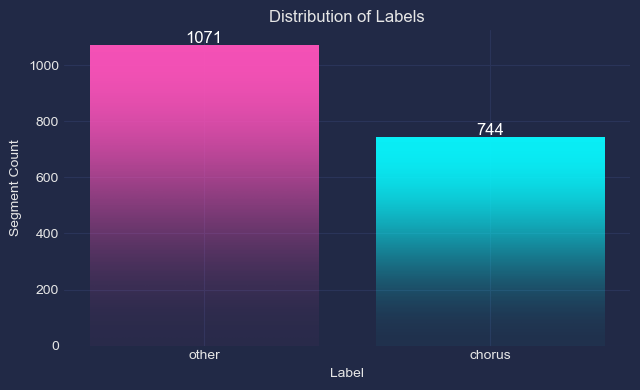

In [32]:
# Plotting the distribution of labels with annotated counts
plt.figure(figsize=(6.5, 4))

labels = df['label'].value_counts().index
counts = df['label'].value_counts().values
colors = ['C0' if label == 'chorus' else 'C1' for label in labels]

bars = plt.bar(labels, counts, color=colors, zorder=2)

# Apply the cyberpunk style to make the bars glow
mplcyberpunk.add_bar_gradient(bars=bars)

plt.title('Distribution of Labels')
plt.xlabel('Label')
plt.ylabel('Segment Count')

# Annotating bars with label counts
for bar, count in zip(bars, counts):
    plt.annotate(f'{int(count)}', 
                 (bar.get_x() + bar.get_width() / 2, count),
                 ha='center', va='center', fontsize=12, color='white', 
                 xytext=(0, 5), textcoords='offset points')

plt.tight_layout()
plt.show()



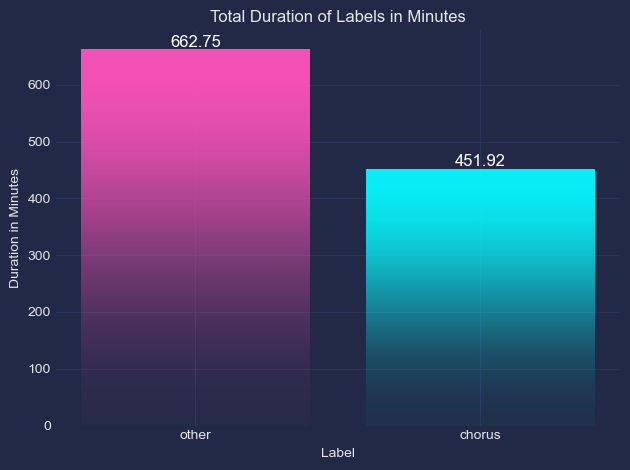

In [33]:
# Calculate the duration for each segment
df['duration'] = df['end_time'] - df['start_time']

# Sum the durations based on the label
duration_summary = df.groupby('label')['duration'].sum().reset_index()

# Convert duration from seconds to minutes with two decimal points
duration_summary['duration'] = duration_summary['duration'] / 60
duration_summary['duration'] = duration_summary['duration'].round(2)

# Convert 'label' to categorical for consistent color assignment
duration_summary['label'] = pd.Categorical(duration_summary['label'], categories=["other", "chorus"])
duration_summary.sort_values('label', inplace=True)
categories = duration_summary['label'].cat.codes
colors = [f"C{i}" for i in categories]

# Plotting
bars = plt.bar(duration_summary['label'], duration_summary['duration'], color=['C1', 'C0'], zorder=2)

mplcyberpunk.add_bar_gradient(bars=bars)

plt.title('Total Duration of Labels in Minutes')
plt.xlabel('Label')
plt.ylabel('Duration in Minutes')

# Annotating bars with the duration
for bar, height in zip(bars, duration_summary['duration']):
    plt.annotate(f'{height}', 
                 (bar.get_x() + bar.get_width() / 2, height),
                 ha='center', va='center', 
                 fontsize=12, color='white', 
                 xytext=(0, 5), 
                 textcoords='offset points')

plt.tight_layout()
plt.show()

### Number of Labeled Chorus Segments per Song

---

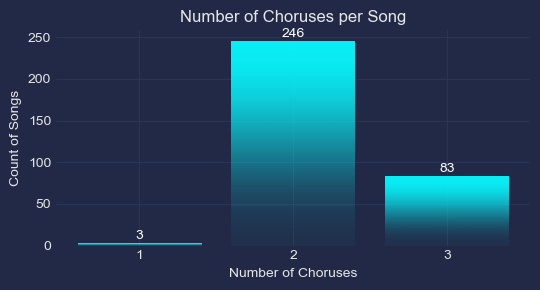

In [35]:
# Calculate the number of choruses per song
choruses_per_song = df[df['label'] == 'chorus'].groupby('SongID').size()

# Prepare data for plotting
chorus_counts = choruses_per_song.value_counts().sort_index()
labels = chorus_counts.index
counts = chorus_counts.values

# Plotting
plt.figure(figsize=(5.5, 3))
bars = plt.bar(labels.astype(str), counts, color='C0', zorder=2)

# Apply the cyberpunk style to make the bars glow
mplcyberpunk.add_bar_gradient(bars=bars)

plt.title('Number of Choruses per Song')
plt.xlabel('Number of Choruses')
plt.ylabel('Count of Songs')

# Annotating bars with count of songs
for bar, count in zip(bars, counts):
    plt.annotate(f'{int(count)}', 
                 (bar.get_x() + bar.get_width() / 2, count),
                 ha='center', va='center', fontsize=10, color='white', 
                 xytext=(0, 5), textcoords='offset points')

plt.tight_layout()
plt.show()

### Distribution of Chorus Lengths

---

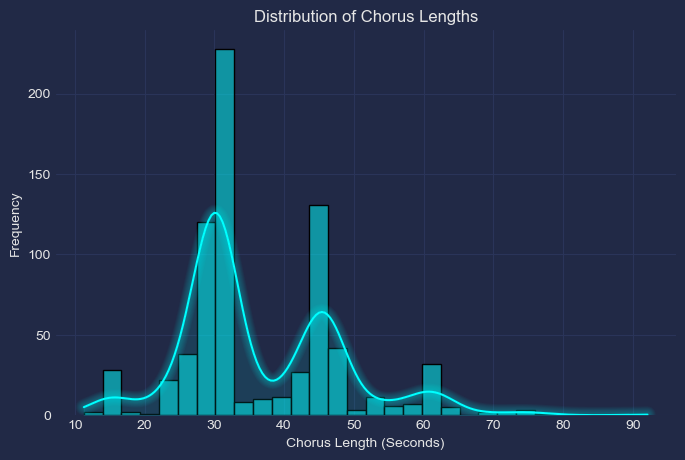

In [38]:
# Plotting the distribution of chorus lengths
df['chorus_length'] = np.where(df['label'] == 'chorus', df['end_time'] - df['start_time'], 0)
plt.figure(figsize=(8, 5))
ax = sns.histplot(df.loc[df['chorus_length'] > 0, 'chorus_length'], bins=30, kde=True, color='cyan')

# Adding glow effects to the line (KDE)
mplcyberpunk.make_lines_glow()
mplcyberpunk.add_underglow()

ax.set_title('Distribution of Chorus Lengths')
ax.set_xlabel('Chorus Length (Seconds)')
ax.set_ylabel('Frequency')

plt.show()

### Distribution of Chorus Positions within Tracks

---


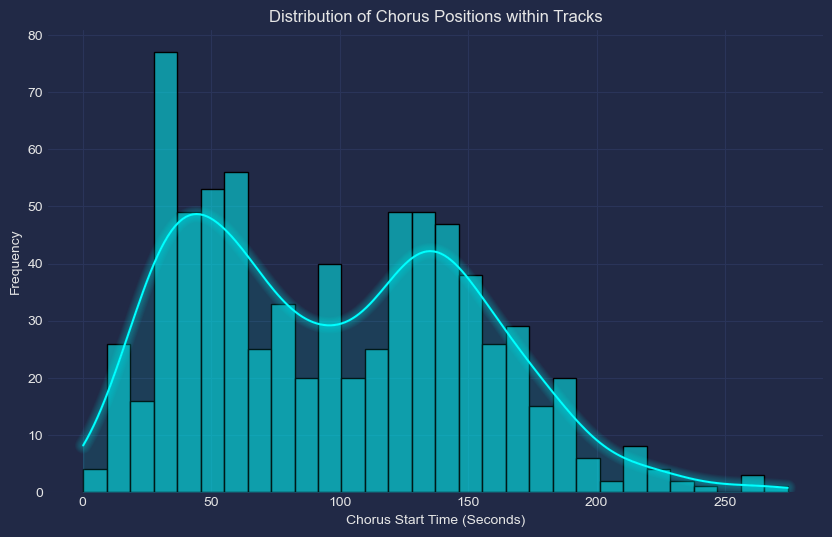

In [39]:
# Plotting the distribution of chorus start times within tracks
plt.figure(figsize=(10, 6))
ax = sns.histplot(df.loc[df['label'] == 'chorus', 'start_time'], bins=30, kde=True, color='cyan')

# Adding glow effects to the line (KDE)
mplcyberpunk.make_lines_glow()
mplcyberpunk.add_underglow()

ax.set_title('Distribution of Chorus Positions within Tracks')
ax.set_xlabel('Chorus Start Time (Seconds)')
ax.set_ylabel('Frequency')

plt.show()

### Song-level Analyses using Spotify Features 

---

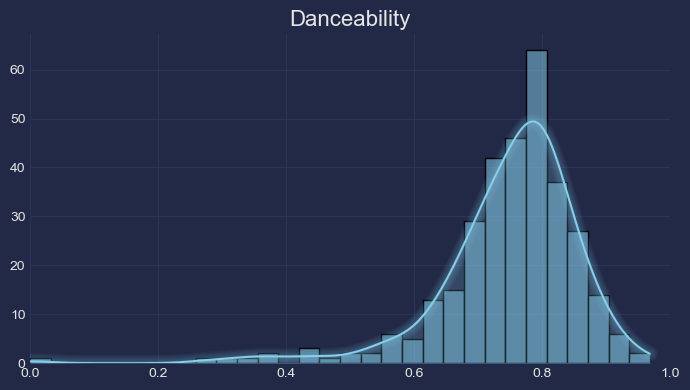

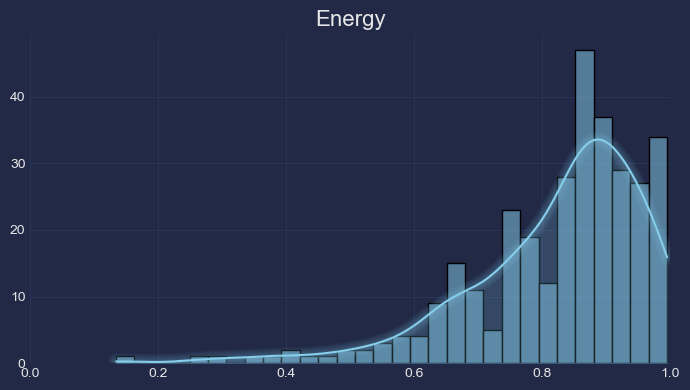

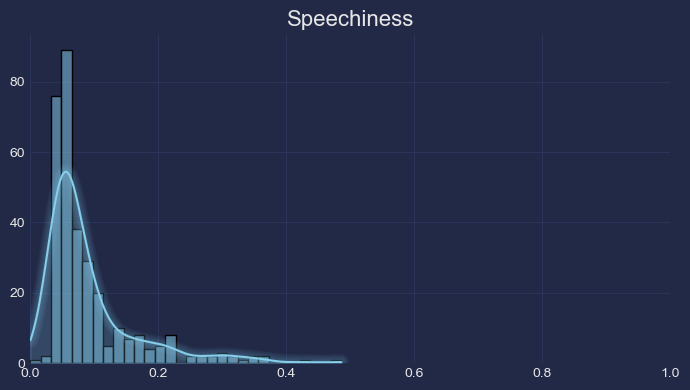

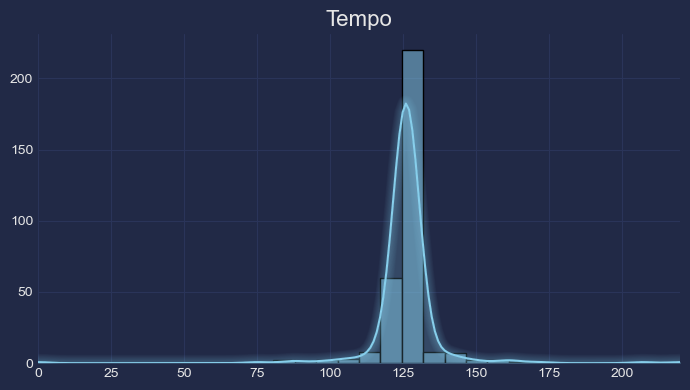

In [48]:
# Filter the DataFrame to include only unique songs
song_level_df = df.drop_duplicates(subset=['SongID'])

# Specify the features you want to plot
features_to_plot = ['sp_danceability', 'sp_energy', 'sp_speechiness', 'sp_tempo']

# Define custom xlim for each feature, except for tempo
feature_xlims = {
    'sp_danceability': (0, 1),
    'sp_energy': (0, 1),
    'sp_speechiness': (0, 1),
    # Tempo will be determined based on its min and max values
}

for feature in features_to_plot:
    plt.figure(figsize=(7, 4))
    sns.histplot(song_level_df[feature], bins=30, kde=True, color='skyblue', edgecolor='black')
    plt.title(feature.replace('sp_', '').replace('_', ' ').title(), fontsize=16)
    plt.xlabel('')
    plt.ylabel('')
    
    # Apply custom xlim if defined, else set xlim based on the min and max for Tempo
    if feature in feature_xlims:
        plt.xlim(feature_xlims[feature])
    else:  # For Tempo
        plt.xlim(song_level_df[feature].min(), song_level_df[feature].max())
    
    # Apply cyberpunk style to KDE line
    mplcyberpunk.add_glow_effects(plt.gca())
    mplcyberpunk.add_underglow(plt.gca())

    plt.tight_layout()
    plt.show()

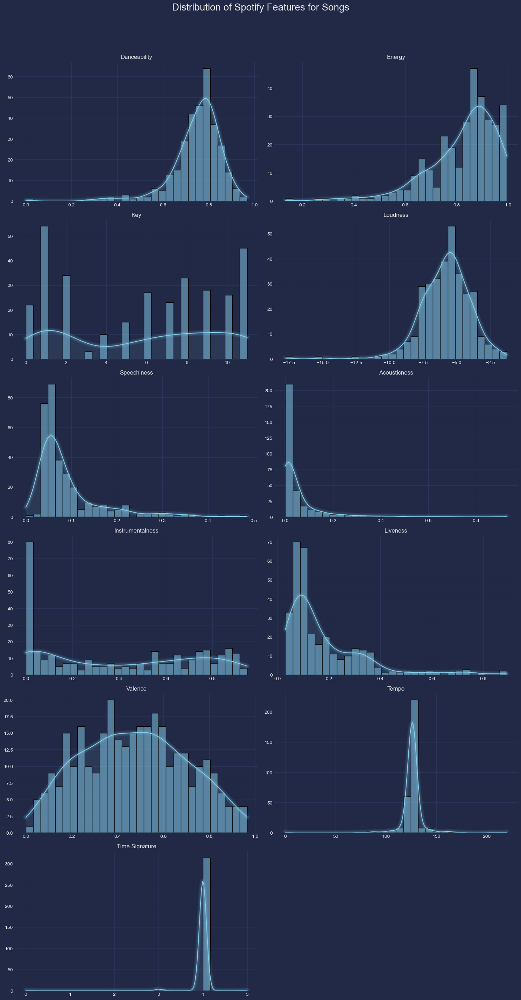

In [46]:
# Simplify and optimize the plotting of Spotify features for unique songs
song_level_df = df.drop_duplicates(subset=['SongID'])
spotify_features = [col for col in song_level_df.columns if col.startswith('sp_') and col != 'sp_genre']

# Determine layout size for subplots
nrows, ncols = (len(spotify_features) + 1) // 2, 2

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
fig.suptitle("Distribution of Spotify Features for Songs", fontsize=20)

# Flatten axes for easier iteration and plot histograms for each feature
for i, feature in enumerate(spotify_features):
    ax = axes.flat[i]
    sns.histplot(song_level_df[feature], ax=ax, bins=30, kde=True, color='skyblue', edgecolor='black')
    ax.set_title(feature.replace('sp_', '').replace('_', ' ').title())
    ax.set(xlabel='', ylabel='')

    mplcyberpunk.make_lines_glow(ax)
    mplcyberpunk.add_underglow(ax)

# Hide unused subplots
for ax in axes.flat[i + 1:]:
    ax.set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Genre-level Exploratory Analysis

---

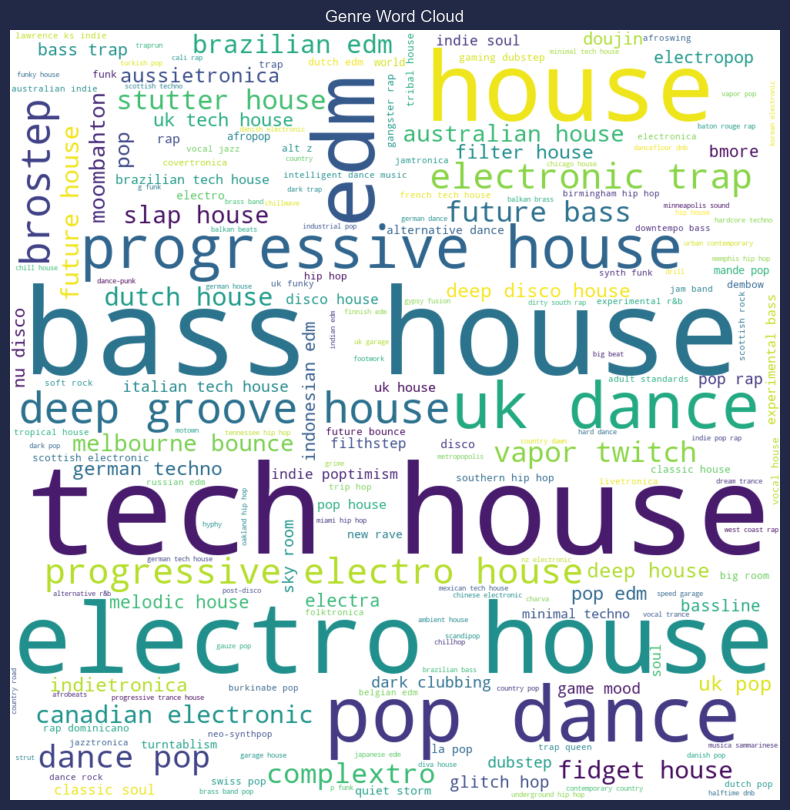

In [49]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Prepare the data for the word cloud and the bar chart
df_genres = df.copy()
df_genres['sp_genre'] = df_genres['sp_genre'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])
all_genres = [genre for sublist in df_genres['sp_genre'] for genre in sublist]
genre_counts = pd.Series(all_genres).value_counts()
popular_genres = genre_counts[genre_counts >= 5]

# Create a word cloud of popular genres
wordcloud = WordCloud(width=1000, height=1000, background_color='white').generate_from_frequencies(popular_genres)

# Count unique artists associated with each genre
genre_artist_counts = {genre: df_genres[df_genres['sp_genre'].apply(lambda x: genre in x)]['Artists'].str.split('/').explode().nunique() 
                       for genre in genre_counts.index}
sorted_genre_artist_counts = dict(sorted(genre_artist_counts.items(), key=lambda item: item[1], reverse=True)[:50])

# Plot the word cloud 
plt.figure(figsize=(12, 10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.title('Genre Word Cloud')
plt.show()

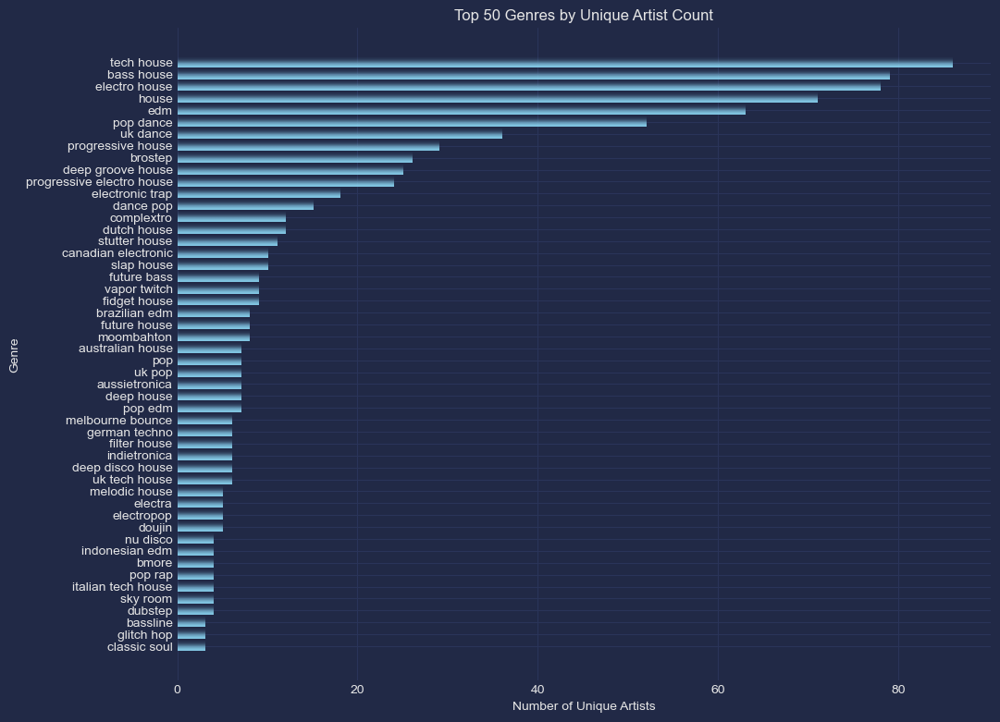

In [51]:
# Create a new figure for the bar chart
plt.figure(figsize=(12, 9))  # Adjust the size as needed
plt.barh(list(sorted_genre_artist_counts.keys()), list(sorted_genre_artist_counts.values()), color='skyblue')
plt.xlabel('Number of Unique Artists')
plt.ylabel('Genre')
plt.title('Top 50 Genres by Unique Artist Count')
plt.gca().invert_yaxis()
mplcyberpunk.add_bar_gradient(bars=plt.gca().patches)
plt.tight_layout(pad=5)
plt.show()



### Genre Association Network

---

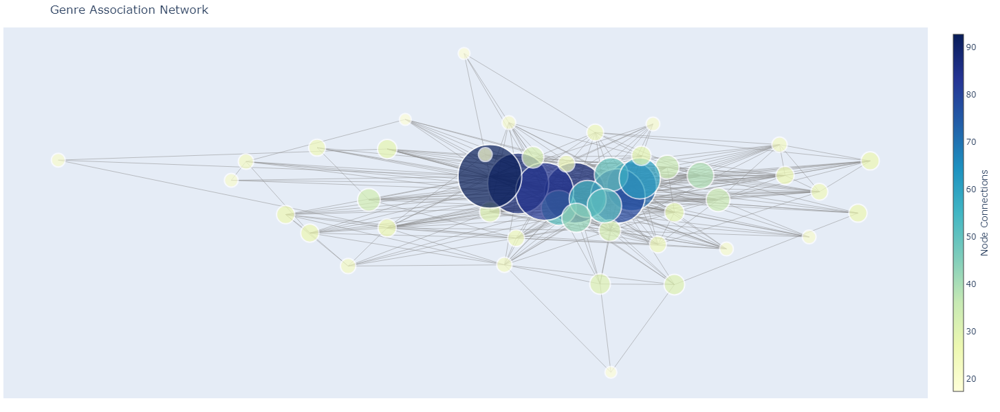

In [10]:
import networkx as nx
import math
import plotly.graph_objs as go

# Initialize graph and get top genres
G = nx.Graph()
top_genres = list(sorted_genre_artist_counts.keys())[:50]  

# Build genre-artist associations
genre_artist_counts = {}
for genres, artists in df_genres[df_genres['sp_genre'].apply(lambda x: any(g in x for g in top_genres))][['sp_genre', 'Artists']].values:
    artists_set = set(artists.split('/'))
    for genre in genres:
        if genre in top_genres:
            genre_artist_counts.setdefault(genre, set()).update(artists_set)

# Add nodes based on genre artist counts
for genre, artists in genre_artist_counts.items():
    G.add_node(genre, size=len(artists))

# Add edges between genres sharing artists
for genres in df_genres['sp_genre']:
    for genre1 in genres:
        for genre2 in genres:
            if genre1 in top_genres and genre2 in top_genres and genre1 != genre2:
                weight = 1 + G[genre1][genre2]['weight'] if G.has_edge(genre1, genre2) else 1
                G.add_edge(genre1, genre2, weight=weight)

# Layout calculation and edge/node extraction
pos = nx.spring_layout(G, k=0.3, iterations=50)
edge_x, edge_y = [], []
for edge in G.edges():
    x0, y0, x1, y1 = *pos[edge[0]], *pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

node_x, node_y = zip(*[pos[node] for node in G.nodes()])
node_sizes = [10 * math.sqrt(G.nodes[node]['size']) for node in G.nodes()]

# Plot configuration
edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), mode='lines', hoverinfo='none')
node_trace = go.Scatter(x=node_x, y=node_y, mode='markers', hoverinfo='text', marker=dict(
    showscale=True, colorscale='YlGnBu', size=node_sizes, color=node_sizes, line_width=2,
    colorbar=dict(thickness=15, title='Node Connections', xanchor='left', titleside='right')))

node_trace.text = [f'{node}: {G.nodes[node]["size"]} artists' for node in G.nodes()]

fig = go.Figure(data=[edge_trace, node_trace], layout=go.Layout(
    title='Genre Association Network', showlegend=False, hovermode='closest',
    margin=dict(b=20, l=5, r=5, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), width=800, height=600))

fig.show()


### Spotify Audio Features Averaged by Genre

---

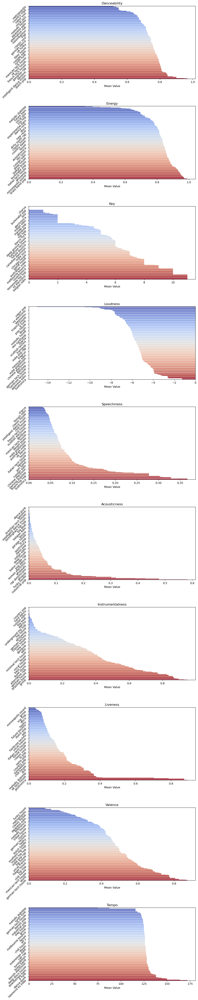

In [12]:
# Exploding the 'sp_genre' column
df_exploded = df.assign(sp_genre=df['sp_genre'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])).explode('sp_genre')

# Calculate mean of features by genre
features = [
    'sp_danceability', 'sp_energy', 'sp_key', 'sp_loudness', 
    'sp_speechiness', 'sp_acousticness', 'sp_instrumentalness', 
    'sp_liveness', 'sp_valence', 'sp_tempo'
]
genre_features = df_exploded.groupby('sp_genre')[features].mean().reset_index()

# Determine the number of rows for subplots
nrows = len(features)

# Create a large figure to accommodate all subplots
plt.figure(figsize=(10, 5 * nrows))

# Loop through the features and create a subplot for each
for i, feature in enumerate(features):
    plt.subplot(nrows, 1, i + 1)
    sorted_data = genre_features.sort_values(by=feature, ascending=True)
    sns.barplot(x=feature, y='sp_genre', data=sorted_data, palette='coolwarm')
    plt.title(feature.split('_')[1].capitalize())
    plt.xlabel('Mean Value')
    plt.ylabel('')

    # Select every 10th label and rotate them
    selected_indices = np.arange(0, len(sorted_data), 10)
    selected_labels = sorted_data.iloc[selected_indices]['sp_genre']
    plt.yticks(selected_indices, selected_labels, rotation=45)

plt.tight_layout()
plt.show()

## Label Validation

---

In this section, we aim to evaluate the quality of manually labeled chorus segments, tempo estimation methods, and beat-grid generation algorithms.

It's important to note that this evaluation is conducted in the absence of an external ground truth for direct comparison. Instead, we are banking on the hypothesis that a strong alignment between the chorus labels and an independently generated beat-grid and tempo estimation signifies proximity to what would be considered the "true" structure of the song. This alignment-based approach to validation assumes that both the manual labeling process and the algorithmic estimations accurately capture the essential features of the music, thereby enabling the autonomous DJ system to perform seamlessly. To this end, we will also A/B test various parameter estimation methods to see which one yields the best alignment with chorus labels.

### Methodology

1. **Manual Labeling of Choruses:** Choruses were manually labeled such that the start aligns with the first downbeat of the initial bar, while the end follows the last downbeat of the final bar. Refer to the [Mixin Data Annotation Guide](https://docs.google.com/document/d/1NorWU7DheD0gmgCQtoegtga73mRPj3a_B4EIB_Ppnvc/edit?usp=sharing) for the full criteria and methodology. The chorus endpoints can be used to derive a beat grid, whose quality we can assess through its proximity to chorus start/end markers. Close alignment between labels and bar grid indices would suggest consistent labeling per the operational definiition. 
2. **Tempo Estimation**: Tempo is an important parameter that should be estimated as accurately as possible, as it will be used to to generate a beat and bar grid, which can then be used to partition songs into meaningful units for modeling and mixing. 
3. **Assumptions & Hypothesis**: 
- To examine whether our labels are consistent with our operational definition, we hypothesize that the chorus start and end timestamps are located on or within an acceptable distance from an index in the bar grid. In other words, a chorus should be fully encapsulated in between two bar indices.  
- We also use this opportunity to test various tempo estimation methods and grid generating algorithms under the assumption that tempos and grids closer to ground truth will result in a closer alignment between labels and bar indices. 

### Load Data

In [1]:
import numpy as np
import pandas as pd
import librosa
from tqdm.auto import tqdm
from math import floor, sqrt
from scipy.stats import pearsonr
from scipy.signal import correlate

# Load the dataset
file_path = '../data/dataframes/clean_labeled.csv'  
df = pd.read_csv(file_path)

df.head()

,SongID,start_time,end_time,start_frame,end_frame,label,TrackName,Artists,Genre,FilePath,...,sp_loudness,sp_speechiness,sp_acousticness,sp_instrumentalness,sp_liveness,sp_valence,sp_tempo,sp_time_signature,sp_genre,sampling_rate
0,1,0.0,61.000000,0,5718,other,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
1,1,61.0,121.900000,5718,11428,chorus,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
2,1,121.9,167.700000,11428,15721,other,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
3,1,167.7,228.600000,15721,21431,chorus,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
4,1,228.6,259.995011,21431,24374,other,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000


---

### Functions

In [7]:
def beat_tracking_dp(y, sr, onset_env=None, hop_length=128, alpha=0.5):
    """Perform beat tracking using dynamic programming."""
    tempo_estimate, _ = librosa.beat.beat_track(y=y, sr=sr, hop_length=hop_length)
    round_tempo = round(tempo_estimate)
    tempo_hypotheses = [round_tempo - 1, round_tempo, tempo_estimate, round_tempo + 1]
    tempo_hypotheses = np.unique(tempo_hypotheses)

    if onset_env is None:
        onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
    time_step = hop_length / sr
    time_grid = np.arange(len(onset_env)) * time_step
    C = np.zeros((len(onset_env), len(tempo_hypotheses)))
    P = np.zeros_like(C, dtype=int)

    for i, t in enumerate(time_grid[1:], 1):
        for k, tempo in enumerate(tempo_hypotheses):
            tau_p = 60 / tempo
            start = max(0, i - int(2 * tau_p / time_step))
            end = max(0, i - int(tau_p / (2 * time_step)))
            if start < end:
                transition_scores = C[start:end, k] - alpha * (np.log((t - time_grid[start:end]) / tau_p))**2
                best_predecessor = start + np.argmax(transition_scores)
                max_score = transition_scores[best_predecessor - start]
            else:
                best_predecessor = 0
                max_score = 0
            C[i, k] = onset_env[i] + max_score
            P[i, k] = best_predecessor

    best_tempo_index = np.argmax(C[-1])
    best_bpm = tempo_hypotheses[best_tempo_index]

    # Backtrace to recover the beat sequence
    beat_frames = [len(onset_env) - 1]  # Start from the last frame
    current_frame = beat_frames[-1]

    while current_frame > 0:
        current_frame = P[current_frame, best_tempo_index]
        beat_frames.append(current_frame)

    beat_frames.pop()  # Remove the last appended frame which is zero due to initialization
    beat_frames.reverse()  # Reverse the beat frames to be in chronological order

    return best_bpm, beat_frames

def adjust_tempo_value(tempo):
    """Adjusts a single tempo value to be between 70 and 140 bpm."""
    if tempo > 140:
        return tempo / 2
    elif tempo < 70:
        return tempo * 2
    else:
        return tempo

def generate_beats_and_meters(first_beat_time, tempo, time_signature_num, duration):
    """Generate beat and meter grids within the duration of a song."""
    seconds_per_beat = 60.0 / tempo
    beats_per_meter = time_signature_num
    seconds_per_meter = seconds_per_beat * beats_per_meter

    # Generate beat grid forward and backwards
    beat_grid_forward = [first_beat_time + i * seconds_per_beat for i in range(int((duration - first_beat_time) / seconds_per_beat))]
    beat_grid_backward = [first_beat_time - i * seconds_per_beat for i in range(1, int(first_beat_time / seconds_per_beat) + 1)]
    beat_grid_backward.reverse()

    # Combine beat grids
    beat_grid = beat_grid_backward + beat_grid_forward

    # Generate meter grid forward and backwards
    meter_grid_forward = [first_beat_time + i * seconds_per_meter for i in range(int((duration - first_beat_time) / seconds_per_meter))]
    meter_grid_backward = [first_beat_time - i * seconds_per_meter for i in range(1, int(first_beat_time / seconds_per_meter) + 1)]
    meter_grid_backward.reverse()

    # Combine meter grids
    meter_grid = meter_grid_backward + meter_grid_forward

    return beat_grid, meter_grid

---

### Preprocessing Loop to Generate Beat and Meter Grids

In [ ]:
from tqdm.auto import tqdm
import pandas as pd
import librosa
import numpy as np

# Define constants
sr = 44100
hop_length = 128
df = pd.read_csv('../data/dataframes/clean_labeled.csv')

# Initialize results list
results = []

# Loop through each unique SongID in the DataFrame
for song_id in tqdm(df['SongID'].unique(), desc="Processing..."):
    data = df.loc[df['SongID'] == song_id]
    audio_path = f'../data/audio_files/processed/{song_id}.mp3'
    y_original, sr_original = librosa.load(audio_path, sr=None)
    y = librosa.resample(y_original, orig_sr=sr_original, target_sr=sr)
    y_perc = librosa.effects.percussive(y)
    onset_env = librosa.onset.onset_strength(y=y_perc, sr=sr, hop_length=hop_length)
    
    # Beat tracking with custom function
    #tempo, beats = beat_tracking_dp(y_perc, sr=sr, onset_env=onset_env, hop_length=hop_length)
    
    # Librosa's beat tracking
    tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
    
    # Spotify's tempo, if available, else fallback to Librosa's estimate
    sp_tempo = data['sp_tempo'].iloc[0] if not pd.isnull(data['sp_tempo'].iloc[0]) else tempo
    
    # Adjust tempo values as needed
    tempo = round(adjust_tempo_value(tempo))
    sp_tempo = adjust_tempo_value(sp_tempo)
    
    # Time signature handling
    time_signature = data['sp_time_signature'].iloc[0] if not pd.isnull(data['sp_time_signature'].iloc[0]) else 4
    time_signature = int(time_signature) if time_signature != 0 else 4
    
    # Beat times
    beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=hop_length)
    
    # Beat and bar grids
    duration = librosa.get_duration(y=y, sr=sr)
    beat_grid, meter_grid = generate_beats_and_meters(beat_times[0], tempo, time_signature, duration) 
    sp_beat_grid, sp_meter_grid = generate_beats_and_meters(beat_times[0], sp_tempo, time_signature, duration) 
    
    # Appending results for each song
    results.append({
        "song_id": song_id,
        "duration": duration,
        "time_signature": time_signature,
        "tempo": tempo,
        "sp_tempo": sp_tempo,
        "beat_grid": beat_grid,
        "sp_beat_grid": sp_beat_grid,
        "meter_grid": meter_grid,
        "sp_meter_grid": sp_meter_grid
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

In [14]:
results_df.to_csv('../data/dataframes/results_031024.csv', index=False)

### Visualizing the difference between tempo estimation methods on single songs

---

In [16]:
df_chorus = df.loc[df['label'] == 'chorus', ['SongID', 'start_time', 'end_time','sp_time_signature']]
df_chorus = df_chorus.merge(results_df, left_on='SongID', right_on='song_id')
df_chorus = df_chorus[['SongID', 'start_time', 'end_time', 'duration', 'sp_time_signature','tempo', 'sp_tempo', 
                       'beat_grid', 'sp_beat_grid', 'meter_grid', 'sp_meter_grid']]
df_chorus.to_csv('../data/dataframes/results2.csv', index=False)

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
from scipy.stats import ttest_rel
from scipy.stats import zscore

%matplotlib inline
pd.set_option('display.max_columns', None)  
pd.set_option('display.max_colwidth', 15) 

# Load the datasets
df_chorus = pd.read_csv('../data/dataframes/results2.csv')

df_chorus.head()

,SongID,start_time,end_time,duration,sp_time_signature,tempo,sp_tempo,beat_grid,sp_beat_grid,meter_grid,sp_meter_grid
0,1,61.0,121.9,259.995011,4.0,126,126.007,[0.06965986...,[0.06965986...,[0.06965986...,[0.06965986...
1,1,167.7,228.6,259.995011,4.0,126,126.007,[0.06965986...,[0.06965986...,[0.06965986...,[0.06965986...
2,2,92.2,138.3,276.425011,4.0,125,125.023,[0.04353741...,[0.04353741...,[0.04353741...,[0.04353741...
3,2,184.3,230.4,276.425011,4.0,125,125.023,[0.04353741...,[0.04353741...,[0.04353741...,[0.04353741...
4,3,47.6,91.4,179.529002,4.0,126,126.036,[0.25179138...,[0.25233544...,[0.25179138...,[0.25233544...


### Identifying outliers (songs with highly differing tempo estimations)

In [42]:
# Adjusts sp_tempo values to be between 70 and 140 and halved if between 138 and 140 if greater than 1.95 * lib_tempo.
def adjust_tempo_values(sp_tempo, tempo):
    # Check if sp_tempo is within a harmonic of tempo
    if sp_tempo > 1.95 * tempo and sp_tempo < 2.05 * tempo:
        return sp_tempo / 2
    elif sp_tempo > 0.475 * tempo and sp_tempo < 0.525 * tempo:
        return sp_tempo * 2
    if sp_tempo < 70:
        return sp_tempo * 2
    return sp_tempo

# Apply the adjustment to the tempo columns
df_chorus['tempo'] = df_chorus['tempo'].apply(lambda x: x / 2 if x >= 140 else x * 2 if x < 70 else x)
df_chorus['sp_tempo'] = df_chorus.apply(lambda row: adjust_tempo_values(row['sp_tempo'], row['tempo']), axis=1)

# Calculate the absolute differences
df_chorus['diff_sp_tempo_tempo'] = (df_chorus['sp_tempo'] - df_chorus['tempo']).abs()

df_chorus['z_score_diff'] = zscore(df_chorus['diff_sp_tempo_tempo'])

# Filter out outliers based on the Z-score
outliers_z = df_chorus[(df_chorus['z_score_diff'].abs() > 3)]
outliers_df = outliers_z[['SongID', 'sp_tempo', 'tempo']]
outliers_df

,SongID,sp_tempo,tempo
155,115,116.0450,77.0
156,115,116.0450,77.0
434,324,0.0000,122.0
435,324,0.0000,122.0
436,324,0.0000,122.0
579,441,87.5080,117.0
580,441,87.5080,117.0
603,458,113.1840,85.0
604,458,113.1840,85.0
607,460,80.0255,107.0


In [43]:
# Removing outliers from the dataset for the following analyses
outlier_song_ids = outliers_df['SongID'].unique()
df_chorus_cleaned = df_chorus[~df_chorus['SongID'].isin(outlier_song_ids)]

# Removing the outlier where sp_tempo = 0 from both datasets
df_chorus = df_chorus[df_chorus['sp_tempo'] != 0]

### Comparing tempo estimations:
A paired t-test is used to determine if there are statistically significant differences between the mean tempo values reported by these different tempo estimation methods. We'll test with and without outliers removed to see if these outliers have a significant impact on tempo comparisons. Given the importance of accurate tempo estimation in our project's overall goal, outliers may need to be removed from the dataset and inspected before being reinstated.

In [44]:
# Function to calculate Cohen's d for effect size
def cohen_d(x, y):
    """Calculate Cohen's d for effect size."""
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (x.mean() - y.mean()) / (((nx - 1) * x.std() ** 2 + (ny - 1) * y.std() ** 2) / dof) ** 0.5

# Function to format p-value
def format_p_value(p):
    """Format p-value for reporting."""
    if p < 0.01 or np.isclose(p, 0.01):
        return "<= 0.01"
    else:
        return f"= {p:.3f}"

# Conduct paired t-tests on datasets with and without outliers and store results in a DataFrame
ttest_results_list = []

comparisons = [
    ('sp_tempo', 'tempo', 'sp_tempo vs. tempo')
]

for condition, df in [('with_outliers', df_chorus), ('without_outliers', df_chorus_cleaned)]:
    for x_col, y_col, comparison_name in comparisons:
        t_stat, p_val = ttest_rel(df[x_col], df[y_col])
        effect_size = cohen_d(df[x_col], df[y_col])
        ttest_results_list.append({
            'Condition': condition,
            'Comparison': comparison_name,
            't-Statistic': f"{t_stat:.3f}",
            'p-Value': f"p {format_p_value(p_val)}",
            'Cohen\'s d': f"{effect_size:.3f}"
        })

# Convert the list of results to a DataFrame
ttest_results_df = pd.DataFrame(ttest_results_list)

# Display the results in a nicely formatted table
ttest_results_df.set_index(['Condition', 'Comparison'], inplace=True)
ttest_results_df

,,t-Statistic,p-Value,Cohen's d
Condition,Comparison,,,
with_outliers,sp_tempo vs. tempo,0.264,p = 0.792,0.003
without_outliers,sp_tempo vs. tempo,0.188,p = 0.851,0.000


Both tempos were pretty much the same regardless of outliers.

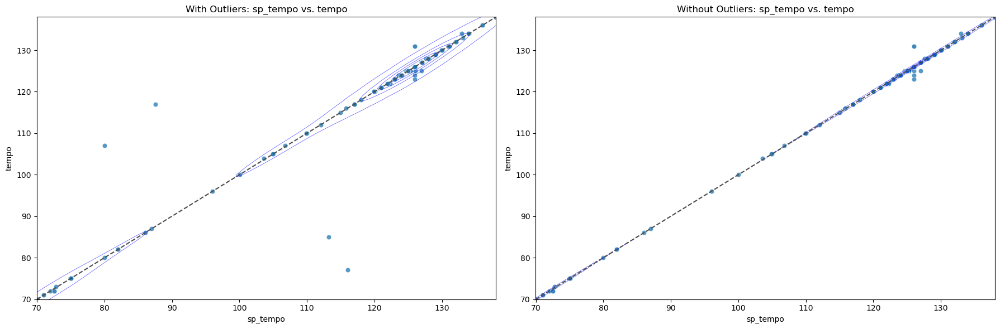

In [49]:
# Determine common axis limits for all scatter plots
all_tempo_data = pd.concat([df_chorus, df_chorus_cleaned], ignore_index=True)
common_min = all_tempo_data[['tempo', 'sp_tempo']].min().min()
common_max = all_tempo_data[['tempo', 'sp_tempo']].max().max()

# Create scatter plots with density contours to compare tempo estimations for both datasets
fig, axes = plt.subplots(1, 2, figsize=(18, 6))  # Adjusted for 2 plots in a vertical layout

# Titles for the plots
titles = ['With Outliers: sp_tempo vs. tempo', 'Without Outliers: sp_tempo vs. tempo']

# Plot for dataset with outliers
sns.scatterplot(x='sp_tempo', y='tempo', data=df_chorus, ax=axes[0], alpha=0.5)
sns.kdeplot(x='sp_tempo', y='tempo', data=df_chorus, ax=axes[0], levels=5, color='blue', linewidths=0.5, alpha=0.7)
axes[0].set_xlim(common_min, common_max)
axes[0].set_ylim(common_min, common_max)
axes[0].plot([common_min, common_max], [common_min, common_max], ls="--", c=".3")
axes[0].set_title(titles[0])

# Plot for dataset without outliers
sns.scatterplot(x='sp_tempo', y='tempo', data=df_chorus_cleaned, ax=axes[1], alpha=0.5)
sns.kdeplot(x='sp_tempo', y='tempo', data=df_chorus_cleaned, ax=axes[1], levels=5, color='blue', linewidths=0.5, alpha=0.7)
axes[1].set_xlim(common_min, common_max)
axes[1].set_ylim(common_min, common_max)
axes[1].plot([common_min, common_max], [common_min, common_max], ls="--", c=".3")
axes[1].set_title(titles[1])

plt.tight_layout()
plt.show()

### Assessing Label Validity and Tempo Estimation Accuracy

---
We use the absolute value of the **Mean Error** to assess the validity of labeled data (in this case, the timing of chorus start and end points). The Mean Error represents the discrepancy (in seconds) between the chorus start or end time and the nearest meter in the grids derived from 'tempo'and 'sp_tempo'. Since choruses were labeled specifically to start and end on the first downbeat of their respective meters, a low mean error indicates that the labels are true to their labeling method. 

The tempo estimation method that results in the lowest mean error is the one that we will use going forward.

In [55]:
df = df_chorus

In [56]:
import numpy as np
from math import sqrt
from scipy.stats import pearsonr
from scipy.signal import correlate
import ast

def find_nearest(grid, point):
    """Find the nearest grid point to a given time point."""
    return min(grid, key=lambda x: abs(x - point))

def calculate_me(start_time, end_time, grid):
    """Calculate the Mean Error for start and end times against a grid."""
    if not grid:
        return None
    start_error = abs(start_time - find_nearest(grid, start_time))
    end_error = abs(end_time - find_nearest(grid, end_time))
    return (start_error + end_error) / 2

def calculate_rmse(start_time, end_time, grid):
    """Calculate the Root Mean Squared Error for start and end times against a grid."""
    if not grid:
        return None
    start_error = (start_time - find_nearest(grid, start_time)) ** 2
    end_error = (end_time - find_nearest(grid, end_time)) ** 2
    mean_squared_error = (start_error + end_error) / 2
    return sqrt(mean_squared_error)

# Assuming 'df' is the DataFrame containing the data
grid_types = ['meter_grid', 'sp_meter_grid']
metrics = ['ME', 'RMSE']

# Convert string representations of lists into actual lists of floats
for grid_type in grid_types:
    df[grid_type] = df[grid_type].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
    df[grid_type] = df[grid_type].apply(lambda x: [float(i) for i in x])

# Calculate ME and RMSE for each grid type
for grid_type in grid_types:
    df[f'ME_{grid_type}'] = df.apply(lambda row: calculate_me(row['start_time'], row['end_time'], row[grid_type]), axis=1)
    df[f'RMSE_{grid_type}'] = df.apply(lambda row: calculate_rmse(row['start_time'], row['end_time'], row[grid_type]), axis=1)

# Create a summary of the metrics
metrics_summary = pd.DataFrame()

for grid in grid_types:
    for metric in metrics:
        column_name = f"{metric}_{grid}"
        metrics_summary.loc['mean', column_name] = df[column_name].mean()
        metrics_summary.loc['std', column_name] = df[column_name].std()
        metrics_summary.loc['min', column_name] = df[column_name].min()
        metrics_summary.loc['25%', column_name] = df[column_name].quantile(0.25)
        metrics_summary.loc['median', column_name] = df[column_name].median()
        metrics_summary.loc['75%', column_name] = df[column_name].quantile(0.75)
        metrics_summary.loc['max', column_name] = df[column_name].max()

metrics_summary

,ME_meter_grid,RMSE_meter_grid,ME_sp_meter_grid,RMSE_sp_meter_grid
mean,0.415957,0.462012,0.418673,0.464821
std,0.556492,0.726031,0.558547,0.729351
min,0.004545,0.004632,0.000884,0.001076
25%,0.049148,0.052245,0.067907,0.069857
median,0.273484,0.276185,0.272650,0.275564
75%,0.528095,0.543424,0.538891,0.552172
max,8.937141,12.298808,8.966293,12.320309


### Box Plots for ME, RMSE of Beat and Bar Alignments

---

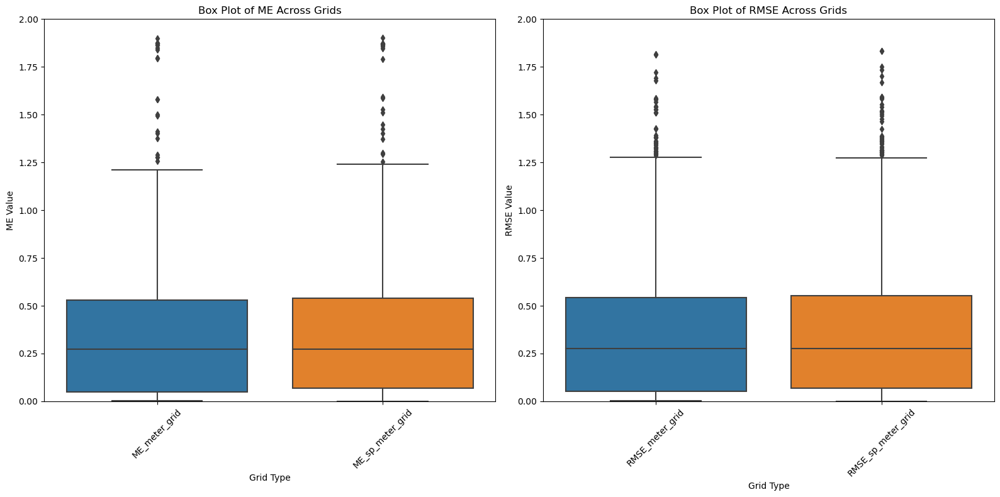

In [57]:
plt.figure(figsize=(16, 8))  

# Subplot 1 for ME
plt.subplot(1, 2, 1)  
me_columns = [f"ME_{grid}" for grid in grid_types]
sns.boxplot(data=df[me_columns])
plt.title('Box Plot of ME Across Grids')
plt.xticks(rotation=45)
plt.xlabel('Grid Type')
plt.ylabel('ME Value')
plt.ylim(0, 2)  

# Subplot 2 for RMSE
plt.subplot(1, 2, 2)  
rmse_columns = [f"RMSE_{grid}" for grid in grid_types]
sns.boxplot(data=df[rmse_columns])
plt.title('Box Plot of RMSE Across Grids')
plt.xticks(rotation=45)
plt.xlabel('Grid Type')
plt.ylabel('RMSE Value')
plt.ylim(0, 2)  

plt.tight_layout()
plt.show()

### ANOVA Comparing Mean Difference in Bar-Chorus Alignment as a Result of Tempo Estimation Method

In [58]:
from scipy import stats
import numpy as np
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd  

# Assuming 'grid_types' is defined elsewhere and includes 'bar_grid'
bar_me_columns = [f"ME_{grid}" for grid in grid_types]

# Preparing a list of ME values for each bar grid to use in ANOVA
bar_me_values_per_grid = [df[col].dropna() for col in bar_me_columns]

# Conducting ANOVA for bar grids only
f_value, p_value = stats.f_oneway(*bar_me_values_per_grid)

print(f"ANOVA Test Results for Bar Grids:\nF-Value: {f_value}\nP-Value: {p_value}")

# Interpreting the results of ANOVA
if p_value < 0.05:
    print("There is a statistically significant difference between the means of the bar grids. Proceeding with Tukey HSD test...")
    
    # Flatten ME values and corresponding bar grid labels into arrays for Tukey HSD test
    bar_me_values = np.concatenate(bar_me_values_per_grid)
    bar_grids = np.array([grid for grid in grid_types for _ in range(len(df[f"ME_{grid}"].dropna()))])
    
    tukey_result_bar = pairwise_tukeyhsd(endog=bar_me_values, groups=bar_grids, alpha=0.05)
    print("\nTukey HSD Test Results for Bar Grids:")
    print(tukey_result_bar)

ANOVA Test Results for Bar Grids:
F-Value: 0.008788609476634754
P-Value: 0.925322359420697


THe bar grids produced by both our tempo and Spotify's tempo yielded similar accuracies with both methods having chorus end points within median distance of .27 seconds away from the nearest meter. This is pretty good to see.

---

## Audio Feature Extraction and Visualization
In this section, we will extract various audio features and visualize them to help us understand which features are pertinent in audio segmentation.

In [60]:
import random
import pickle
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Load sample audio file
def load_pickle(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)
    
def adjust_tempo_values(*tempo_values):
    """Adjusts tempo values based on specified logic, including rounding tempos close to an integer."""
    adjusted_tempos = []
    for tempo in tempo_values:
        # Check if tempo is within 0.05 of an integer
        if abs(round(tempo) - tempo) <= 0.05:
            adjusted_tempo = round(tempo)
        elif tempo > 140:
            adjusted_tempo = tempo / 2
        elif tempo < 70:
            adjusted_tempo = tempo * 2
        else:
            adjusted_tempo = tempo
        adjusted_tempos.append(adjusted_tempo)
    return adjusted_tempos

def generate_beats_and_meters(first_beat_time, tempo, time_signature_num, duration):
    """Generate beat and measure grids within the duration of a song."""
    seconds_per_beat = 60.0 / tempo
    beats_per_measure = time_signature_num
    seconds_per_measure = seconds_per_beat * beats_per_measure
    beat_grid_forward = [first_beat_time + i * seconds_per_beat for i in range(int((duration - first_beat_time) / seconds_per_beat))]
    beat_grid_backward = [first_beat_time - i * seconds_per_beat for i in range(1, int(first_beat_time / seconds_per_beat) + 1)]
    beat_grid_backward.reverse()
    beat_grid = beat_grid_backward + beat_grid_forward
    measure_grid_forward = [first_beat_time + i * seconds_per_measure for i in range(int((duration - first_beat_time) / seconds_per_measure))]
    measure_grid_backward = [first_beat_time - i * seconds_per_measure for i in range(1, int(first_beat_time / seconds_per_measure) + 1)]
    measure_grid_backward.reverse()
    measure_grid = measure_grid_backward + measure_grid_forward

    return beat_grid, measure_grid

def overlay_meter_chorus(ax, meter_grid, data, beat_synced=False, beat_times=None):
    """Overlay meter grid and chorus segments on visualizations."""
    chorus_data = data.loc[data['label'] == 'chorus']
    y_min, y_max = ax.get_ylim()

    # Overlay chorus segments
    for j, row in chorus_data.iterrows():
        start_time = row['start_time']
        end_time = row['end_time']
        # If the graph is beat-synced, find the closest beat times
        if beat_synced and beat_times is not None:
            start_time = min(beat_times, key=lambda x:abs(x-start_time))
            end_time = min(beat_times, key=lambda x:abs(x-end_time))
        ax.fill_between(x=[start_time, end_time], y1=y_min, y2=y_max, 
                        color='green', alpha=0.3, label='Chorus' if j == 0 else None)

    # Overlay meter grid
    for i, meter in enumerate(meter_grid):
        meter_time = meter
        # If the graph is beat-synced, find the closest beat time
        if beat_synced and beat_times is not None:
            meter_time = min(beat_times, key=lambda x:abs(x-meter))
        ax.axvline(x=meter_time, color='grey', linestyle=':', linewidth=2 if i % 4 == 0 else 1, 
                   label='Every 4th Meter' if i == 0 else 'Meter' if i == 1 else None)
    
df = pd.read_csv('../data/clean_labeled.csv')
songs = df['SongID'].unique()
random.seed(42)
random_song_id = int(random.choice(list(songs)))
audio_file = f'../data/audio_files/processed/{random_song_id}.mp3'
data = df.loc[df['SongID'] == random_song_id]

# Load audio file
y, sr = librosa.load(audio_file, sr=None)
y = librosa.resample(y=y, orig_sr=sr, target_sr=24000)
sr = 24000
y_harm, y_perc = librosa.effects.hpss(y)
onset_env = librosa.onset.onset_strength(y=y_perc, sr=sr, hop_length=128)

# Extract audio features
duration = librosa.get_duration(y=y, sr=sr)

# Beat tracking with custom function
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=128)

# Spotify's tempo, if available, else fallback to Librosa's estimate
if data['sp_tempo'].iloc[0] == 0:
    data['sp_tempo'] = tempo
tempo = data['sp_tempo'].iloc[0] if not pd.isnull(data['sp_tempo'].iloc[0]) else tempo

# Adjust tempo values as needed
tempo = adjust_tempo_values(tempo)[0]

# Time signature handling
time_signature = data['sp_time_signature'].iloc[0] if not pd.isnull(data['sp_time_signature'].iloc[0]) else 4
time_signature = int(time_signature) if time_signature != 0 else 4

# Beat and meter grids
beat_grid, meter_grid = generate_beats_and_meters(librosa.frames_to_time(beats, sr=sr, hop_length=128)[0], tempo, time_signature, duration) 
beat_frames = np.concatenate(([0], beats, [len(onset_env)]))
beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=128)

### Initial Waveform Visualization with Meter Grid and Chorus Overlay
- By visualizing the audio features over a meter grid, it becomes easier to spot naturally occuring segmentation and patterns that occur on a per-meter basis or over a multiple of 4 meters, which is common in many musical forms.
- Labeled chorus segments are highlighted in green blocks so we can see how certain audio feature illuminate them.

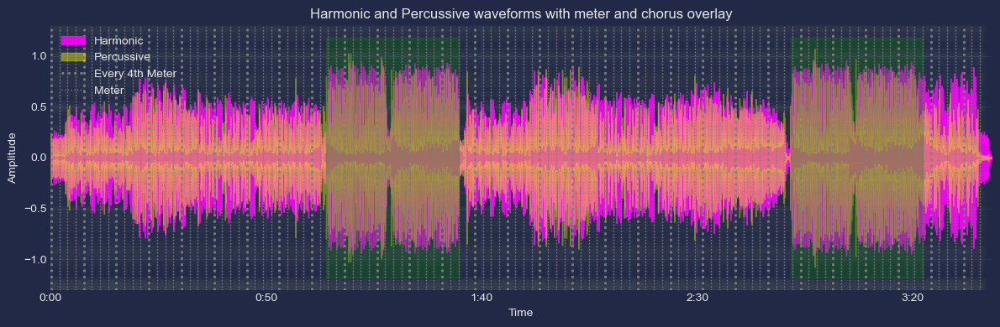

In [75]:
fig, ax = plt.subplots(figsize=(12, 4))

# Plot the harmonic and percussive waveforms
librosa.display.waveshow(y_harm, sr=sr, alpha=0.9, ax=ax, label='Harmonic', color='magenta')
librosa.display.waveshow(y_perc, sr=sr, alpha=0.4, ax=ax, label='Percussive', color='yellow')

# Add the meter grid and chorus overlay
overlay_meter_chorus(ax, meter_grid, data)

# Set labels and title
ax.set_xlim([0, duration])
ax.set_ylabel('Amplitude')
ax.set_title('Harmonic and Percussive waveforms with meter and chorus overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, loc='upper left')

# Add glow effects and gradient fill
mplcyberpunk.add_glow_effects(ax, gradient_fill=False)

plt.tight_layout()
plt.show()

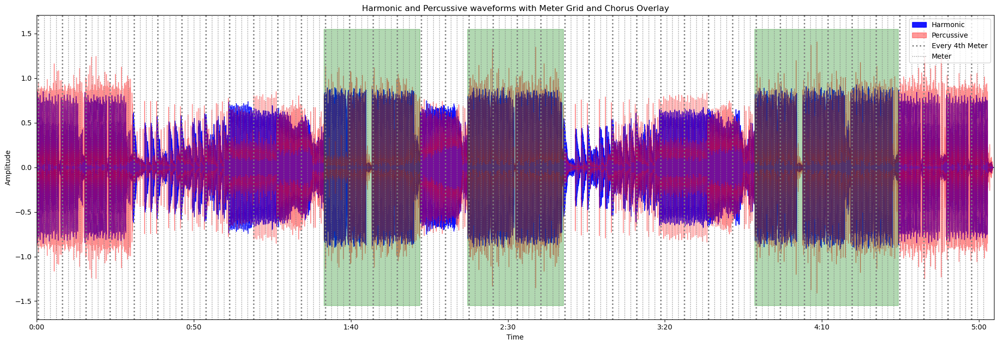

In [393]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.waveshow(y_harm, sr=sr, alpha=0.9, ax=ax, label='Harmonic', color='b')
librosa.display.waveshow(y_perc, sr=sr, alpha=0.4, ax=ax, label='Percussive', color='r')
overlay_meter_chorus(ax, meter_grid, data)

# Set labels and title
ax.set_xlim([0, duration])
ax.set_ylabel('Amplitude')
ax.set_title('Harmonic and Percussive waveforms with Meter Grid and Chorus Overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)
plt.tight_layout()
plt.show()

Here we can see how the meter grid attempts to partition the song into meaningful units. Every 4th meter is emphasized because motifs and patterns tend to unfold in multiples of 4 meters in pop songs. 

---

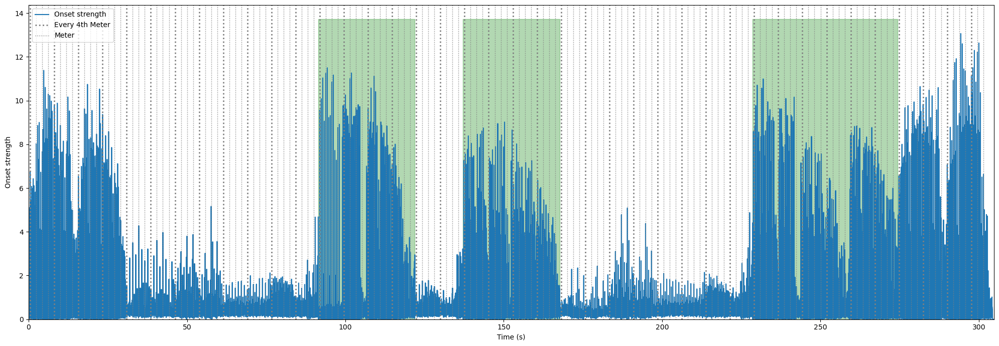

In [413]:
onset_times = librosa.times_like(onset_env, sr=sr, hop_length=128)

fig, ax = plt.subplots(figsize=(20, 7))
ax.plot(onset_times, onset_env, label='Onset strength')

overlay_meter_chorus(ax, meter_grid, data)
ax.set_xlim([0, duration])
ax.set_ylim([0, np.max(onset_env) * 1.1])
ax.set_xlabel('Time (s)')
ax.set_ylabel('Onset strength')

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)

plt.tight_layout()
plt.show()

---

### RMS Energy
- RMS energy, or Root Mean Square energy, is a measure of the power content of an audio signal. 
- It represents the square root of the average power of the signal's amplitude squared over a period of time. 
- RMS energy can be used as an indicator of the loudness of an audio signal. 
- RMS energy is often used in music analysis, audio engineering, and sound processing applications to assess the dynamic range and to normalize audio tracks.

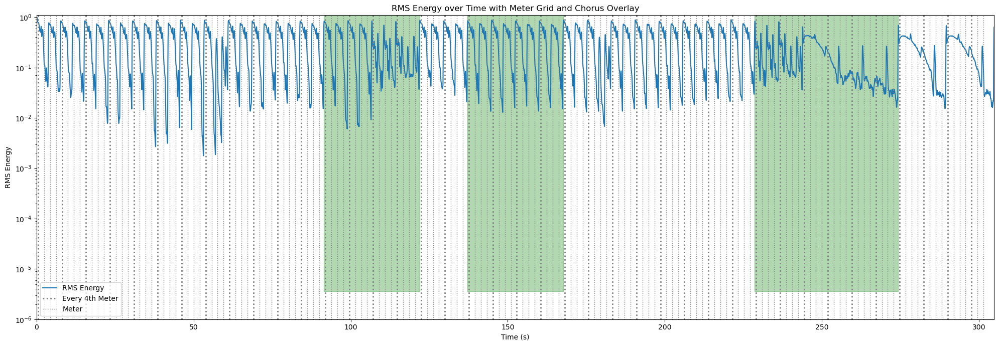

In [428]:
# Compute the RMS energy
S, phase = librosa.magphase(librosa.stft(y, hop_length=128))
rms = librosa.feature.rms(S=S, hop_length=128)
rms_normalized = (rms - np.min(rms)) / (np.max(rms) - np.min(rms))
times = librosa.times_like(rms_normalized)

# Plot the RMS energy
fig, ax = plt.subplots(figsize=(20, 7))
ax.semilogy(times, rms_normalized[0], label='RMS Energy')

# Overlay meter grid and chorus segments
overlay_meter_chorus(ax, meter_grid, data)

# Set labels and title
ax.set_xlim([0, duration])
ax.set_yscale('log')
ax.set_ylim([max(np.min(rms_normalized[0]), 1e-6), np.max(rms_normalized[0]) * 1.1])
ax.set_xlabel('Time (s)')
ax.set_ylabel('RMS Energy')
ax.set_title('RMS Energy over Time with Meter Grid and Chorus Overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)

plt.tight_layout()
plt.show()

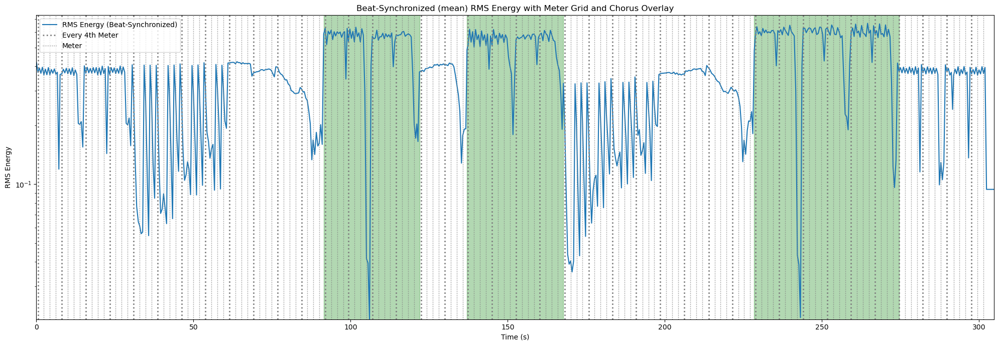

In [447]:
beats_frames = librosa.util.fix_frames(beats, x_min=0, x_max=len(onset_env))
beat_times = librosa.frames_to_time(beats_frames, sr=sr, hop_length=128)

rms_sync = librosa.util.sync(rms_normalized, beat_frames, aggregate=np.mean, axis=1)
rms_sync_flat = np.pad(rms_sync.flatten(), (0, 1), mode='edge') 

# Plot the beat-synchronized RMS energy
fig, ax = plt.subplots(figsize=(20, 7))
ax.semilogy(beat_times, rms_sync_flat, label='RMS Energy (Beat-Synchronized)')

# Set labels and title
ax.set_xlim([0, beat_times[-1]])

# Overlay meter grid and chorus segments
overlay_meter_chorus(ax, meter_grid, data, beat_synced=True, beat_times=beat_times)
ax.set_ylim([max(np.min(rms_sync), 1e-6), np.max(rms_sync) * 1.1])
ax.set_xlabel('Time (s)')
ax.set_ylabel('RMS Energy')
ax.set_title('Beat-Synchronized (mean) RMS Energy with Meter Grid and Chorus Overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)

plt.tight_layout()
plt.show()

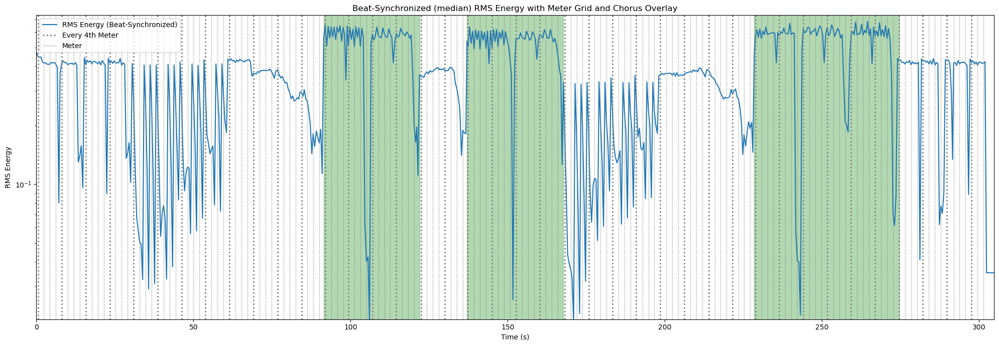

In [458]:
rms_sync_med = librosa.util.sync(rms_normalized, beat_frames, aggregate=np.median, axis=1)
rms_sync_flat_med = np.pad(rms_sync_med.flatten(), (0, 1), mode='edge') 
# Plot the beat-synchronized RMS energy
fig, ax = plt.subplots(figsize=(20, 7))
ax.semilogy(beat_times, rms_sync_flat_med, label='RMS Energy (Beat-Synchronized)')

# Set labels and title
ax.set_xlim([0, beat_times[-1]])
# Overlay meter grid and chorus segments
overlay_meter_chorus(ax, meter_grid, data, beat_synced=True, beat_times=beat_times)
ax.set_ylim([max(np.min(rms_sync), 1e-6), np.max(rms_sync) * 1.1])
ax.set_xlabel('Time (s)')
ax.set_ylabel('RMS Energy')
ax.set_title('Beat-Synchronized (median) RMS Energy with Meter Grid and Chorus Overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)

plt.tight_layout()
plt.show()

### RMS Visualization Analysis
- We can see a natural break point in the RMS energy at the onset of the chorus.
- However, we cannot determine where the chorus ends solely with RMS energy in this particular song.

---

### Melspectrogram Visualization
- The Mel-spectrogram captures both spectral and temporal characteristics of music. 

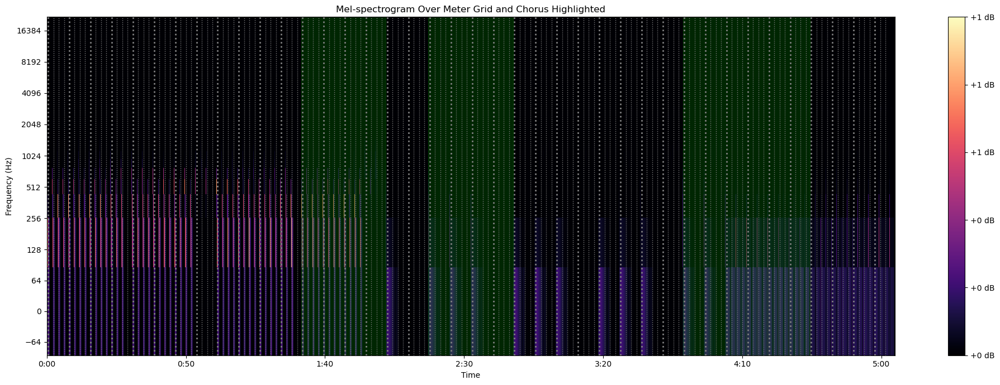

In [483]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, hop_length=128)
S_norm = (S - S.min()) / (S.max() - S.min())

log_S = librosa.power_to_db(S_norm, ref=np.max)

# Plot the Mel-spectrogram
fig, ax = plt.subplots(figsize=(20, 7))
img = librosa.display.specshow(S_norm, sr=sr, x_axis='time', y_axis='log', ax=ax)
overlay_meter_chorus(ax, meter_grid, data)
# Set labels and title
ax.set_xlim([0, librosa.get_duration(y=y, sr=sr)])  # Set the x-axis limits to the duration of the audio
ax.set_ylabel('Frequency (Hz)')
ax.set_title('Mel-spectrogram Over Meter Grid and Chorus Highlighted')

# Display color bar
fig.colorbar(img, ax=ax, format="%+2.f dB")

plt.tight_layout()
plt.show()

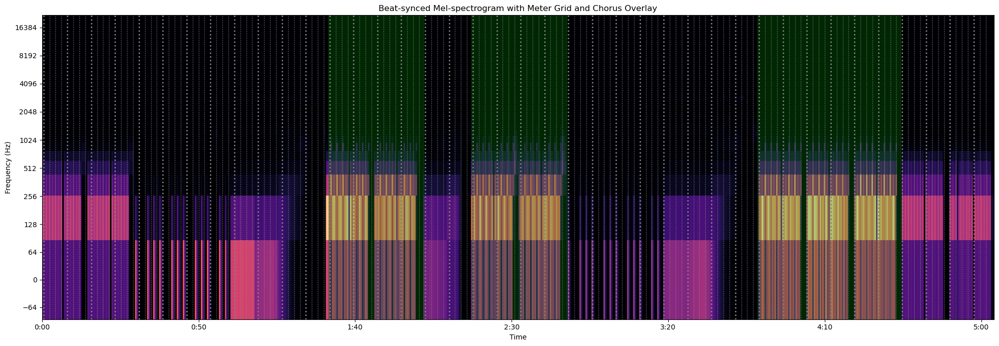

In [509]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, hop_length=128)
S_norm = (S - S.min()) / (S.max() - S.min())
mel_sync = librosa.util.sync(S_norm, beat_frames, aggregate=np.mean, axis=1)
mel_sync = np.pad(mel_sync, ((0, 0), (0, 1)), mode='edge')

# Plot the beat-synced mel-spectrogram
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(mel_sync, y_axis='log', x_axis='time',
                         x_coords=beat_times, ax=ax, hop_length=hop_length, sr=sr)
overlay_meter_chorus(ax, meter_grid, data)  # Assuming this is a function you have defined to overlay additional information
ax.set_ylabel('Frequency (Hz)')
ax.set_title('Beat-synced Mel-spectrogram with Meter Grid and Chorus Overlay')

plt.tight_layout()
plt.show()

#### Decomposed Mel-spectrogram using Non-negative Matrix Factorization
- Decomposing a mel-spectrogram using NMF reduces its dimensionality which can be beneficial for compression and reducing computational costs for machine learning.
- The decomposition can help in identifying recurring patterns or "templates" in the spectrogram, which can correspond to specific types of sounds or instruments.
- Decomposition can help in denoising the signal by separating the noise components from the signal components.

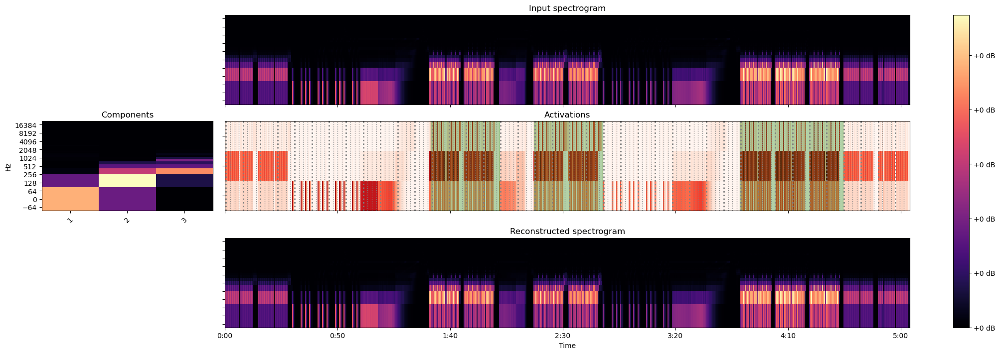

In [510]:
hop_length = 128  
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, hop_length=128)
S_norm = (S - S.min()) / (S.max() - S.min())
mel_sync = librosa.util.sync(S_norm, beat_frames, aggregate=np.mean, axis=1)
mel_sync = np.pad(mel_sync, ((0, 0), (0, 1)), mode='edge')

# Compute the mel-spectrogram and decompose
mel_comps, mel_acts = librosa.decompose.decompose(mel_sync, n_components=3, sort=True, max_iter=1000)

# Define the layout for subplots
layout = [
    ['.', 'A', 'A', 'A', 'A'],
    ['B', 'C', 'C', 'C', 'C'],
    ['.', 'D', 'D', 'D', 'D']
]

# Create the subplots with specified figure size
fig, ax = plt.subplot_mosaic(layout, figsize=(20, 7), constrained_layout=True)

# Display the original mel-spectrogram
librosa.display.specshow(mel_sync, y_axis='log', x_axis='time', ax=ax['A'], 
                         sr=sr, hop_length=hop_length, x_coords=beat_times)
ax['A'].set(title='Input spectrogram')
ax['A'].label_outer()

# Display the components without transposing
librosa.display.specshow(mel_comps,
                         y_axis='log', ax=ax['B'], sr=sr, hop_length=hop_length)
ax['B'].set(title='Components')
# Set custom x-tick labels to denote component numbers
ax['B'].set_xticks(np.arange(mel_comps.shape[1]))
ax['B'].set_xticklabels([f"{i+1}" for i in range(mel_comps.shape[1])])
ax['B'].tick_params(axis='x', rotation=45)

# Display the activations with a red color map
librosa.display.specshow(mel_acts, x_axis='time', ax=ax['C'], cmap='Reds', sr=sr, hop_length=hop_length, x_coords=beat_times)
ax['C'].set(ylabel='Component number', title='Activations')
# Set custom y-tick labels to denote component numbers
ax['C'].set_yticks(np.arange(mel_acts.shape[0]))
ax['C'].set_yticklabels([f"{i+1}" for i in range(mel_acts.shape[0])])
ax['C'].sharex(ax['A'])
ax['C'].label_outer()

# Assuming overlay_meter_chorus is a function you have defined to overlay data on the activations plot
overlay_meter_chorus(ax['C'], meter_grid, data)

# Reconstruct the spectrogram from the components and activations
S_approx = mel_comps.dot(mel_acts)

# Display the reconstructed spectrogram
img = librosa.display.specshow(mel_sync,
                               y_axis='log', x_axis='time', ax=ax['D'], sr=sr, hop_length=hop_length, x_coords=beat_times)
ax['D'].set(title='Reconstructed spectrogram')
ax['D'].sharex(ax['A'])
ax['D'].sharey(ax['A'])
ax['D'].label_outer()

# Add a colorbar to the figure
fig.colorbar(img, ax=list(ax.values()), format="%+2.f dB")

# Show the plot
plt.show()

#### Mel-spectrogram Analysis
- Visual break points are similar to the ones obserbed in RMS energy.
- With the added dimension of Frequency (Hz) there is potential for more granular analysis than what RMS can offer but the mel-spectrogram as is may be too high-dimensional to visually discern patterns in the music. 
- The activations of the decomposed Mel-spectrogram provide granular information at a lower dimensionality which can be useful for further analysis. The number of components may need to be emperically determined/optimized.
---

### Key-Invariant Chromagram
- A key-invariant chromagram is a type of musical feature representation that displays the intensity of the twelve different pitch classes (C, C#, D, ..., B) regardless of the octave, and is designed to be invariant to the key of the piece. This means that it aims to represent the same musical content in a way that is robust to transpositions, which is useful for deducing patterns across of varying keys. 
- Chromagrams have a resolution of one bin per pitch class, while Mel-spectrograms have a higher frequency resolution, with many bins covering the range of human hearing. This lower dimensionality makes them more suitable for tonal-based analysis

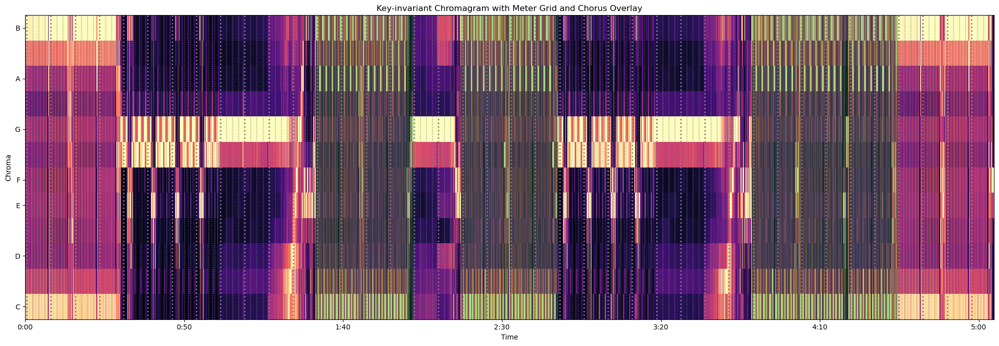

In [507]:
def calculate_ki_chroma(y, sr, hop_length=128):
    """Calculate a key-invariant chromagram for a given audio waveform."""
    chromagram = librosa.feature.chroma_cqt(y=y, sr=sr, bins_per_octave=24, hop_length=hop_length)
    
    # Normalize the chromagram
    chromagram_norm = (chromagram - chromagram.min()) / (chromagram.max() - chromagram.min())
    
    chroma_vals = np.sum(chromagram_norm, axis=1)
    maj_profile = np.array([6.35, 2.23, 3.48, 2.33, 4.38, 4.09, 2.52, 5.19, 2.39, 3.66, 2.29, 2.88])
    min_profile = np.array([6.33, 2.68, 3.52, 5.38, 2.60, 3.53, 2.54, 4.75, 3.98, 2.69, 3.34, 3.17])
    maj_corrs = np.correlate(chroma_vals, maj_profile, mode='same')
    min_corrs = np.correlate(chroma_vals, min_profile, mode='same')
    key_shift = np.argmax(np.concatenate((maj_corrs, min_corrs))) % 12
    return np.roll(chromagram_norm, -key_shift, axis=0)

chroma = calculate_ki_chroma(y_harm, sr, hop_length)

fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(chroma, sr=sr, hop_length=128, y_axis='chroma', x_axis='time')
overlay_meter_chorus(ax, meter_grid, data)
ax.set_ylabel('Chroma')
ax.set_title('Key-invariant Chromagram with Meter Grid and Chorus Overlay')

plt.tight_layout()
plt.show()

#### Beat-synced + Time-lagged + Key-invariant Chromagram

- A beat-synced chromagram reduces the temporal resolution to focus on the harmonic content of each beat, which can simplify the interpretation of the harmonic progression over time. This also helps smooth out rapid transitions or noise in the data, making patterns more discernible.
- By including information from past frames, stacking provides a broader temporal context and makes it easier to recognize patterns that span multiple time steps, which might be missed when looking at individual frames in isolation.
- For machine learning tasks, stacked features can improve the performance of classifiers by providing them with additional context that might be necessary to distinguish between similar classes.

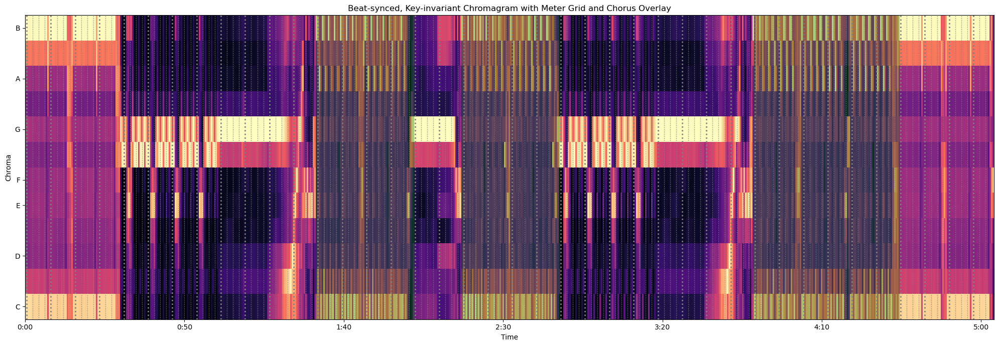

In [508]:
beat_grid_frames = librosa.util.fix_frames(librosa.time_to_frames(beat_grid, sr=sr, hop_length=128), x_min=0)
chroma_sync = librosa.util.sync(chroma, beat_grid_frames)

fig, ax = plt.subplots(figsize=(20, 7))
beat_times = librosa.frames_to_time(beat_grid_frames, sr=sr, hop_length=128)
librosa.display.specshow(chroma_sync, y_axis='chroma', x_axis='time',
                         x_coords=beat_times, ax=ax, hop_length=128)
overlay_meter_chorus(ax, meter_grid, data)
ax.set_ylabel('Chroma')
ax.set_title('Beat-synced, Key-invariant Chromagram with Meter Grid and Chorus Overlay')

plt.tight_layout()
plt.show()

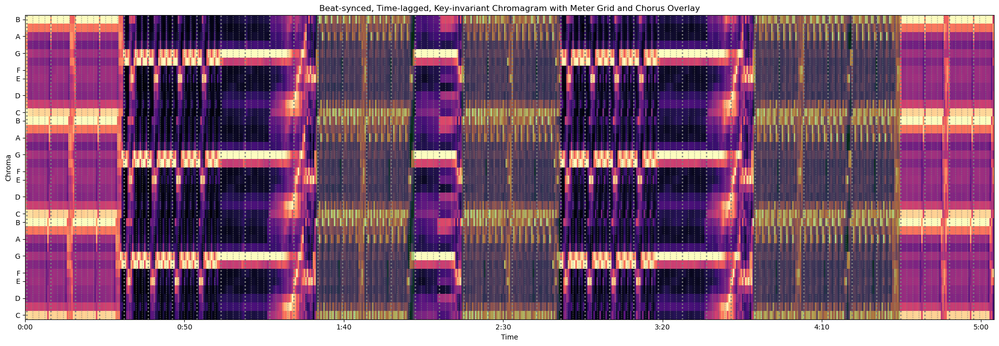

In [492]:
beat_grid_frames = librosa.util.fix_frames(librosa.time_to_frames(beat_grid, sr=sr, hop_length=128), x_min=0)
chroma_sync = librosa.util.sync(chroma, beat_grid_frames)
chroma_lag = librosa.feature.stack_memory(chroma_sync, n_steps=3, mode='edge')

fig, ax = plt.subplots(figsize=(20, 7))
beat_times = librosa.frames_to_time(beat_grid_frames, sr=sr, hop_length=128)
librosa.display.specshow(chroma_lag, y_axis='chroma', x_axis='time',
                         x_coords=beat_times, ax=ax, hop_length=128)
overlay_meter_chorus(ax, meter_grid, data)
ax.set_ylabel('Chroma')
ax.set_title('Beat-synced, Time-lagged, Key-invariant Chromagram with Meter Grid and Chorus Overlay')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Meter-synced, Key-invariant Chromagram with Meter Grid and Chorus Overlay')

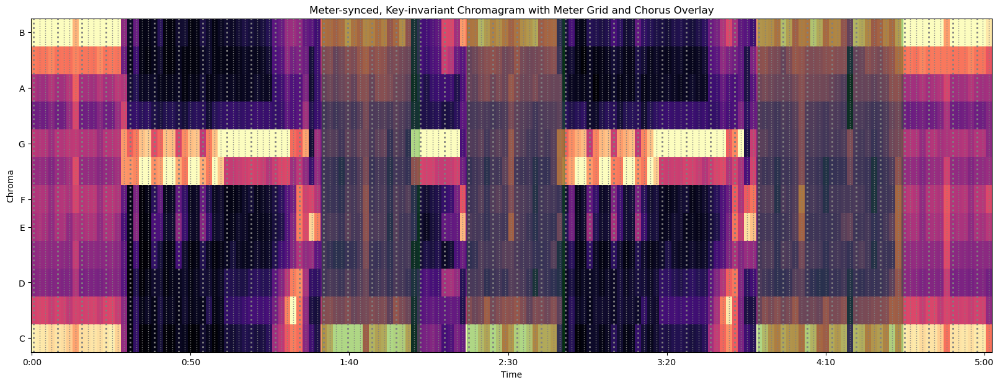

In [493]:
meter_grid_frames = librosa.time_to_frames(meter_grid, sr=sr, hop_length=hop_length)
meter_grid_frames = librosa.util.fix_frames(meter_grid_frames, x_min=0)

chroma = calculate_ki_chroma(y_harm, sr)
chroma_sync = librosa.util.sync(chroma, meter_grid_frames, aggregate=np.median)

fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(chroma_sync, y_axis='chroma', x_axis='time',
                         x_coords=librosa.frames_to_time(meter_grid_frames, sr=sr, hop_length=hop_length), 
                         ax=ax)
overlay_meter_chorus(ax, meter_grid, data)
ax.set_ylabel('Chroma')
ax.set_title('Meter-synced, Key-invariant Chromagram with Meter Grid and Chorus Overlay')

#### Beat-synced + Time-lagged + Key-invariant Chromagram Analysis
- Harmonic patterns and segments are even easier to see than with a normal chromagram.
- The high resolution of a normal chromagram introduces noise that can be eliminated with beat-synced smoothing.

---


### Tempogram
- Tempograms provide information about the tempo of a signal over time. It is analogous to a spectrogram, which represents the spectrum of frequencies over time, but instead, a tempogram captures the tempo variations. In essence, a tempogram reflects how the tempo changes throughout a piece of music or any rhythmic audio signal.
- Although most songs are produced at a global tempo, tempograms are sensitive to subtle variations and arrangements of beats and downbeats. They may also reveal changes in rhythmic density or energy at a given time step (e.g. drum roll before a chorus drop). 
- Tempograms are considerded high-dimensional because they capture the intensity of tempos across a large window of tempos (e.g. 30-600 bpm). Given that a song typically does not contain a continuous range of tempos, tempogram decomposition may be warranted. 

In [501]:
tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)

Text(0.5, 1.0, 'Tempogram')

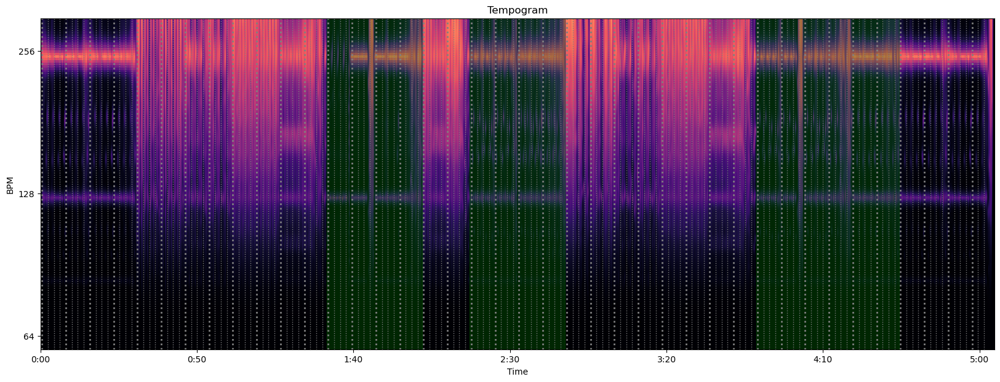

In [505]:
# Create the subplots with specified figure size
fig, ax = plt.subplots(figsize=(20, 7))

# Display the original tempogram
librosa.display.specshow(tempogram, y_axis='tempo', x_axis='time', ax=ax,
                         sr=sr, hop_length=128)
ax.set_ylim(60, 300)
overlay_meter_chorus(ax, meter_grid, data)
ax.set_xlabel('Time')
ax.set_title('Tempogram')

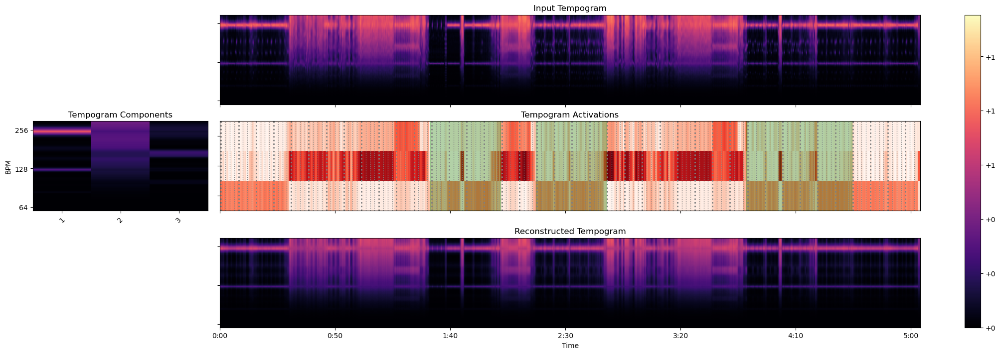

In [506]:
tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
tempogram = np.clip(tempogram, 0, None)
# Normalize the tempogram
tempogram_norm = (tempogram - tempogram.min()) / (tempogram.max() - tempogram.min())

# Synchronize the tempogram with the beat frames
tempogram_sync = librosa.util.sync(tempogram_norm, beat_frames, aggregate=np.mean, axis=1)
tempogram_sync = np.pad(tempogram_sync, ((0, 0), (0, 1)), mode='edge')

# Decompose the synchronized tempogram
tempogram_comps, tempogram_acts = librosa.decompose.decompose(tempogram_sync, n_components=3, sort=True, max_iter=1000)

# Create the subplots with specified figure size
fig, ax = plt.subplot_mosaic(layout, figsize=(20, 7), constrained_layout=True)

# Display the original tempogram
librosa.display.specshow(tempogram_sync, y_axis='tempo', x_axis='time', ax=ax['A'],
                         sr=sr, hop_length=hop_length, x_coords=beat_times)
ax['A'].set(title='Input Tempogram')
ax['A'].set_ylim(60, 300)
ax['A'].label_outer()

# Display the components without transposing
librosa.display.specshow(tempogram_comps, y_axis='tempo', ax=ax['B'], sr=sr, hop_length=hop_length)
ax['B'].set(title='Tempogram Components')
ax['B'].set_ylim(60, 300)
# Set custom x-tick labels to denote component numbers
ax['B'].set_xticks(np.arange(tempogram_comps.shape[1]))
ax['B'].set_xticklabels([f"{i+1}" for i in range(tempogram_comps.shape[1])])
ax['B'].tick_params(axis='x', rotation=45)

# Display the activations with a red color map
librosa.display.specshow(tempogram_acts, x_axis='time', ax=ax['C'], cmap='Reds', sr=sr, hop_length=hop_length, x_coords=beat_times)
ax['C'].set(ylabel='Component number', title='Tempogram Activations')
# Set custom y-tick labels to denote component numbers
ax['C'].set_yticks(np.arange(tempogram_acts.shape[0]))
ax['C'].set_yticklabels([f"{i+1}" for i in range(tempogram_acts.shape[0])])
ax['C'].sharex(ax['A'])
ax['C'].label_outer()

# Assuming overlay_meter_chorus is a function you have defined to overlay data on the activations plot
overlay_meter_chorus(ax['C'], meter_grid, data)

# Reconstruct the tempogram from the components and activations
tempogram_approx = tempogram_comps.dot(tempogram_acts)

# Display the reconstructed tempogram
img = librosa.display.specshow(tempogram_approx, y_axis='tempo', x_axis='time', ax=ax['D'],
                               sr=sr, hop_length=hop_length, x_coords=beat_times)
ax['D'].set(title='Reconstructed Tempogram')
ax['D'].set_ylim(60, 300)
ax['D'].sharex(ax['A'])
ax['D'].sharey(ax['A'])
ax['D'].label_outer()

# Add a colorbar to the figure
fig.colorbar(img, ax=list(ax.values()), format="%+2.f")

# Show the plot
plt.show()

#### Tempogram Analysis
In our specific instance, the tempogram doesn't really help us visually identify the chorus, however it does help us identify other segments of the piece. Tempograms also contain more dimensions than needed (as evident from the horizontal striations in the figure). Decomposing the tempogram into 3 components significantly reduces the number of dimensions and provides a better visualization of the rhythmic segmentation in the song. 

<style>
@import url('https://fonts.googleapis.com/css2?family=Lato:ital,wght@0,100;0,300;0,400;0,700;0,900;1,100;1,300;1,400;1,700;1,900&family=Merriweather:ital,wght@0,300;0,400;0,700;0,900;1,300;1,400;1,700;1,900&display=swap');

/* Apply the Lato font to body text */
body {
    font-family: 'Lato', sans-serif;
    font-size: 12px; /* Base font size for body text */
}

/* Heading styles with Merriweather */
h1 {
    font-family: 'Merriweather', serif;
    font-size: 36px;
    font-weight: 900; /* Merriweather's boldest weight for main headings */
}

h2 {
    font-family: 'Merriweather', serif;
    font-size: 24px;
    font-weight: 700; /* Bold weight for section headings */
}

h3 {
    font-family: 'Merriweather', serif;
    font-size: 14px;
    font-weight: 700; /* Bold weight for sub-section headings */
}

h4 {
    font-family: 'Merriweather', serif;
    font-size: 12px;
    font-weight: 700; /* Bold weight for sub-sub-section headings */
}
/* Additional styles can be added for h5, h6, or other elements as needed */
</style>